<img src="src/uber-logo-une.jpg">

# Uber Pickups

## Imports

### Librairies

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import  OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

import plotly.express as px

### Datasets

In [2]:
data_apr = pd.read_csv("src/uber-raw-data-apr14.csv")
data_aug = pd.read_csv("src/uber-raw-data-aug14.csv")
data_jul = pd.read_csv("src/uber-raw-data-jul14.csv")
data_jun = pd.read_csv("src/uber-raw-data-jun14.csv")
data_may = pd.read_csv("src/uber-raw-data-may14.csv")
data_sep = pd.read_csv("src/uber-raw-data-sep14.csv")
uber_tot = pd.concat([data_apr,data_aug, data_jul, data_jun, data_may,data_sep]).reset_index(drop='index')

In [3]:
uber_tot.shape

(4534327, 4)

In [4]:
uber_tot.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


## Basic models

### Feature selection on total dataset

#### Creating Pickup_time column in datetime format from Date/time

In [5]:
uber_tot['Pickup_time'] = pd.to_datetime(uber_tot['Date/Time'])

In [6]:
uber_tot['Pickup_time']

0         2014-04-01 00:11:00
1         2014-04-01 00:17:00
2         2014-04-01 00:21:00
3         2014-04-01 00:28:00
4         2014-04-01 00:33:00
                  ...        
4534322   2014-09-30 22:57:00
4534323   2014-09-30 22:57:00
4534324   2014-09-30 22:58:00
4534325   2014-09-30 22:58:00
4534326   2014-09-30 22:58:00
Name: Pickup_time, Length: 4534327, dtype: datetime64[ns]

#### Extracting Month, Day of the week from Pickup_time

In [7]:
uber_tot['Month'] = uber_tot['Pickup_time'].apply(lambda x : x.month)
uber_tot['Week_day'] = uber_tot['Pickup_time'].apply(lambda x : x.weekday())

In [8]:
uber_tot

,Date/Time,Lat,Lon,Base,Pickup_time,Month,Week_day
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,2014-04-01 00:11:00,4,1
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,2014-04-01 00:17:00,4,1
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,2014-04-01 00:21:00,4,1
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,2014-04-01 00:28:00,4,1
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,2014-04-01 00:33:00,4,1
...,...,...,...,...,...,...,...
4534322,9/30/2014 22:57:00,40.7668,-73.9845,B02764,2014-09-30 22:57:00,9,1
4534323,9/30/2014 22:57:00,40.6911,-74.1773,B02764,2014-09-30 22:57:00,9,1
4534324,9/30/2014 22:58:00,40.8519,-73.9319,B02764,2014-09-30 22:58:00,9,1
4534325,9/30/2014 22:58:00,40.7081,-74.0066,B02764,2014-09-30 22:58:00,9,1


### Sampled dataset

In [9]:
uber_s = uber_tot.sample(10000, random_state=42).reset_index(drop='index')
uber_s

,Date/Time,Lat,Lon,Base,Pickup_time,Month,Week_day
0,4/10/2014 20:15:00,40.7588,-73.9726,B02617,2014-04-10 20:15:00,4,3
1,6/22/2014 14:48:00,40.8451,-73.9418,B02617,2014-06-22 14:48:00,6,6
2,8/28/2014 22:58:00,40.7399,-73.9823,B02764,2014-08-28 22:58:00,8,3
3,4/28/2014 16:30:00,40.6449,-73.7824,B02682,2014-04-28 16:30:00,4,0
4,9/17/2014 20:40:00,40.7636,-73.9798,B02598,2014-09-17 20:40:00,9,2
...,...,...,...,...,...,...,...
9995,9/29/2014 9:29:00,40.7182,-73.9856,B02682,2014-09-29 09:29:00,9,0
9996,5/30/2014 12:55:00,40.7695,-73.9919,B02682,2014-05-30 12:55:00,5,4
9997,5/23/2014 5:16:00,40.7594,-73.9164,B02682,2014-05-23 05:16:00,5,4
9998,8/3/2014 11:54:00,40.7803,-74.0075,B02598,2014-08-03 11:54:00,8,6


#### Dropping useless columns

In [10]:
uber_s = uber_s.drop(['Date/Time', 'Base', 'Pickup_time'], axis=1)

### Preprocessing on sample

In [11]:
num_features = uber_s.columns.tolist()
cat_features = [num_features.pop(num_features.index('Month'))]
cat_features.append(num_features.pop(num_features.index('Week_day')))
cat_features

['Month', 'Week_day']

In [12]:
num_features

['Lat', 'Lon']

In [13]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])
categorical_transformer = Pipeline(
    steps=[
    ('encoder', OneHotEncoder(drop='first'))
    ])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_features),
        ('cat', categorical_transformer, cat_features)
    ])

In [14]:
us_preprocessed = preprocessor.fit_transform(uber_s)

In [15]:
us_preprocessed

<10000x13 sparse matrix of type '<class 'numpy.float64'>'
	with 37527 stored elements in Compressed Sparse Row format>

### Kmeans on sample

#### Elbow on sample

WCSS for K=1 --> 34651.695699999975
WCSS for K=2 --> 29140.93803629097
WCSS for K=3 --> 24555.473017738557
WCSS for K=4 --> 22879.210410850894
WCSS for K=5 --> 21689.93285563315
WCSS for K=6 --> 20329.431088189835
WCSS for K=7 --> 19267.08597502696
WCSS for K=8 --> 18211.74883308992
WCSS for K=9 --> 16863.087418088588
WCSS for K=10 --> 15883.536158857478


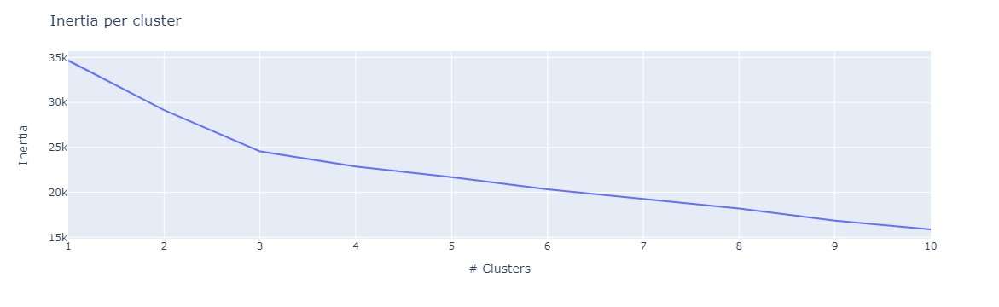

In [16]:
wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(us_preprocessed)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print(f"WCSS for K={i} --> {(wcss[-1])}")

wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)
fig.show()

#### Silouhette on sample

Silhouette score for K=2 is 0.36497214147819523
Silhouette score for K=3 is 0.14960810117721732
Silhouette score for K=4 is 0.1462970695434406
Silhouette score for K=5 is 0.12246646441817687
Silhouette score for K=6 is 0.13020381939262574
Silhouette score for K=7 is 0.15305294067553984
Silhouette score for K=8 is 0.19866657927764614
Silhouette score for K=9 is 0.2060884052249794
Silhouette score for K=10 is 0.2084176762161159


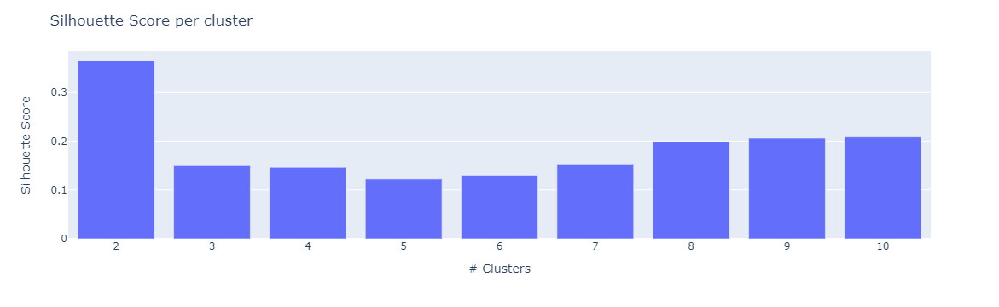

In [17]:
sil = []
k = []
for i in range (2,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(us_preprocessed)
    sil.append(silhouette_score(us_preprocessed, kmeans.predict(us_preprocessed)))
    k.append(i)
    print(f"Silhouette score for K={i} is {sil[-1]}")

cluster_scores=pd.DataFrame(sil)
k_frame = pd.Series(k)

fig = px.bar(data_frame=cluster_scores,  
             x=k, 
             y=cluster_scores.iloc[:, -1]
            )
fig.update_layout(
    yaxis_title="Silhouette Score",
    xaxis_title="# Clusters",
    title="Silhouette Score per cluster"
)

fig.show()

We will take K = 4

In [18]:
kmeans = KMeans(n_clusters=4 , random_state = 0)
kmeans.fit(us_preprocessed)

KMeans(n_clusters=4, random_state=0)

In [19]:
uber_sk = uber_s.copy()

In [20]:
uber_sk['Cluster_KMeans'] = kmeans.labels_
uber_sk

,Lat,Lon,Month,Week_day,Cluster_KMeans
0,40.7588,-73.9726,4,3,3
1,40.8451,-73.9418,6,6,1
2,40.7399,-73.9823,8,3,3
3,40.6449,-73.7824,4,0,2
4,40.7636,-73.9798,9,2,3
...,...,...,...,...,...
9995,40.7182,-73.9856,9,0,0
9996,40.7695,-73.9919,5,4,3
9997,40.7594,-73.9164,5,4,3
9998,40.7803,-74.0075,8,6,3


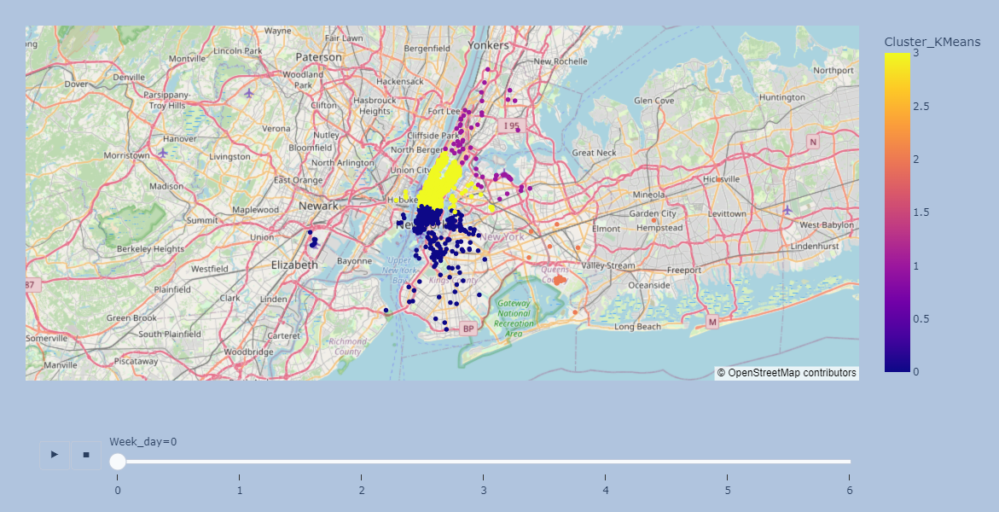

In [21]:
fig = px.scatter_mapbox(uber_sk.sort_values('Week_day'), lat="Lat", lon="Lon", color="Cluster_KMeans",
                        mapbox_style="open-street-map",
                        animation_frame = 'Week_day',
                        zoom=9,
                        height=600)
fig.update_layout(
    
    margin=dict(l=30, r=30, t=30, b=30),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### DBSCAN on sample

#### Euclidian metric

In [22]:
db_euc = DBSCAN(eps=0.4, min_samples=90, metric="euclidean", algorithm="brute")
db_euc.fit(us_preprocessed)

DBSCAN(algorithm='brute', eps=0.4, min_samples=90)

In [23]:
uber_sk['Cluster_db_euc'] = db_euc.labels_
tk = (uber_sk['Cluster_db_euc'] != -1)
uber_skf = uber_sk.loc[tk,:]
uber_skf['Cluster_db_euc'].value_counts()

5     235
10    231
6     227
13    218
8     202
1     200
7     190
11    184
14    170
4     166
0     156
15    147
9     141
3     133
12    133
2     114
16    107
Name: Cluster_db_euc, dtype: int64

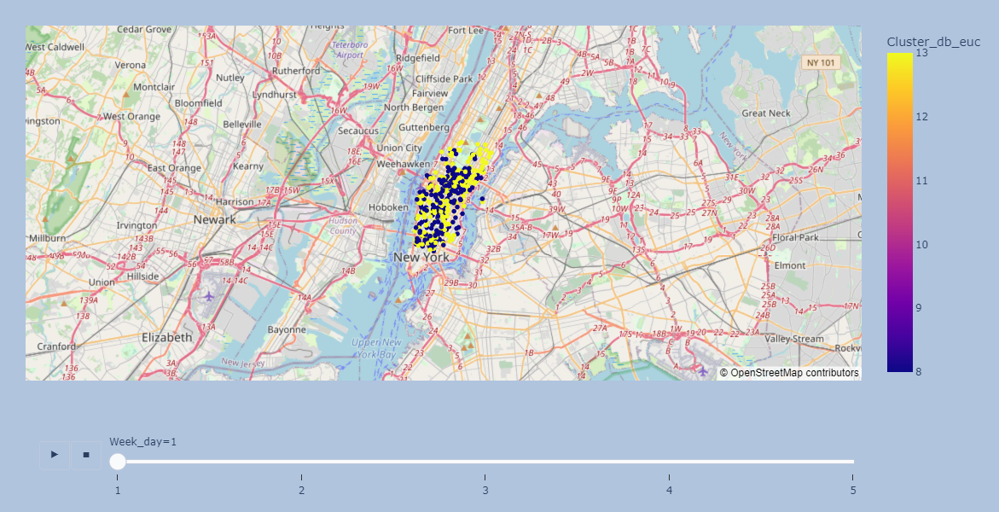

In [24]:
fig = px.scatter_mapbox(uber_skf.sort_values('Week_day'), lat="Lat", lon="Lon", color="Cluster_db_euc",
                        mapbox_style="open-street-map",
                        animation_frame = 'Week_day',
                        zoom=10,
                        height=600)
fig.update_layout(
    
    margin=dict(l=30, r=30, t=30, b=30),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

## More advanced feature selection

### Feature selection on total dataset

In [25]:
uber_tot.head()

,Date/Time,Lat,Lon,Base,Pickup_time,Month,Week_day
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,2014-04-01 00:11:00,4,1
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,2014-04-01 00:17:00,4,1
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,2014-04-01 00:21:00,4,1
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,2014-04-01 00:28:00,4,1
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,2014-04-01 00:33:00,4,1


#### Extracting Hour, Rounded coordinates and classes of 15 min range

In [26]:
uber_tot['Hour'] = uber_tot['Pickup_time'].apply(lambda x : x.hour)
uber_tot['Lat_r'] = uber_tot['Lat'].apply(lambda x : round(x,2))
uber_tot['Lon_r'] = uber_tot['Lon'].apply(lambda x : round(x,2))
uber_tot['Bin_15'] = uber_tot['Pickup_time'].dt.floor("15min")
uber_tot['Bin_15'] = uber_tot['Bin_15'].apply(lambda x : x.strftime('%H:%M'))

In [27]:
uber_tot['Bin_15'][0]

'00:00'

In [28]:
uber_tot

,Date/Time,Lat,Lon,Base,Pickup_time,Month,Week_day,Hour,Lat_r,Lon_r,Bin_15
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,2014-04-01 00:11:00,4,1,0,40.77,-73.95,00:00
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,2014-04-01 00:17:00,4,1,0,40.73,-74.03,00:15
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,2014-04-01 00:21:00,4,1,0,40.73,-73.99,00:15
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,2014-04-01 00:28:00,4,1,0,40.76,-73.98,00:15
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,2014-04-01 00:33:00,4,1,0,40.76,-73.97,00:30
...,...,...,...,...,...,...,...,...,...,...,...
4534322,9/30/2014 22:57:00,40.7668,-73.9845,B02764,2014-09-30 22:57:00,9,1,22,40.77,-73.98,22:45
4534323,9/30/2014 22:57:00,40.6911,-74.1773,B02764,2014-09-30 22:57:00,9,1,22,40.69,-74.18,22:45
4534324,9/30/2014 22:58:00,40.8519,-73.9319,B02764,2014-09-30 22:58:00,9,1,22,40.85,-73.93,22:45
4534325,9/30/2014 22:58:00,40.7081,-74.0066,B02764,2014-09-30 22:58:00,9,1,22,40.71,-74.01,22:45


#### Creating a column with number of pickups giving a 15min class in a month

In [29]:
uber_tot.groupby(['Month','Bin_15'])['Pickup_time'].count().reset_index(name='Pickups')

,Month,Bin_15,Pickups
0,4,00:00,3673
1,4,00:15,3047
2,4,00:30,2701
3,4,00:45,2489
4,4,01:00,2343
...,...,...,...
571,9,22:45,11694
572,9,23:00,10773
573,9,23:15,9380
574,9,23:30,8733


In [30]:
uber_tot['Pickups'] = uber_tot.groupby(['Month','Bin_15'])['Pickup_time'].transform('count')

In [31]:
uber_tot

,Date/Time,Lat,Lon,Base,Pickup_time,Month,Week_day,Hour,Lat_r,Lon_r,Bin_15,Pickups
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,2014-04-01 00:11:00,4,1,0,40.77,-73.95,00:00,3673
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,2014-04-01 00:17:00,4,1,0,40.73,-74.03,00:15,3047
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,2014-04-01 00:21:00,4,1,0,40.73,-73.99,00:15,3047
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,2014-04-01 00:28:00,4,1,0,40.76,-73.98,00:15,3047
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,2014-04-01 00:33:00,4,1,0,40.76,-73.97,00:30,2701
...,...,...,...,...,...,...,...,...,...,...,...,...
4534322,9/30/2014 22:57:00,40.7668,-73.9845,B02764,2014-09-30 22:57:00,9,1,22,40.77,-73.98,22:45,11694
4534323,9/30/2014 22:57:00,40.6911,-74.1773,B02764,2014-09-30 22:57:00,9,1,22,40.69,-74.18,22:45,11694
4534324,9/30/2014 22:58:00,40.8519,-73.9319,B02764,2014-09-30 22:58:00,9,1,22,40.85,-73.93,22:45,11694
4534325,9/30/2014 22:58:00,40.7081,-74.0066,B02764,2014-09-30 22:58:00,9,1,22,40.71,-74.01,22:45,11694


### Sampled dataset

In [32]:
uber_s = uber_tot.sample(10000, random_state=42).reset_index(drop='index')
uber_s

,Date/Time,Lat,Lon,Base,Pickup_time,Month,Week_day,Hour,Lat_r,Lon_r,Bin_15,Pickups
0,4/10/2014 20:15:00,40.7588,-73.9726,B02617,2014-04-10 20:15:00,4,3,20,40.76,-73.97,20:15,8939
1,6/22/2014 14:48:00,40.8451,-73.9418,B02617,2014-06-22 14:48:00,6,6,14,40.85,-73.94,14:45,9054
2,8/28/2014 22:58:00,40.7399,-73.9823,B02764,2014-08-28 22:58:00,8,3,22,40.74,-73.98,22:45,10949
3,4/28/2014 16:30:00,40.6449,-73.7824,B02682,2014-04-28 16:30:00,4,0,16,40.64,-73.78,16:30,10642
4,9/17/2014 20:40:00,40.7636,-73.9798,B02598,2014-09-17 20:40:00,9,2,20,40.76,-73.98,20:30,15664
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9/29/2014 9:29:00,40.7182,-73.9856,B02682,2014-09-29 09:29:00,9,0,9,40.72,-73.99,09:15,9694
9996,5/30/2014 12:55:00,40.7695,-73.9919,B02682,2014-05-30 12:55:00,5,4,12,40.77,-73.99,12:45,6192
9997,5/23/2014 5:16:00,40.7594,-73.9164,B02682,2014-05-23 05:16:00,5,4,5,40.76,-73.92,05:15,2500
9998,8/3/2014 11:54:00,40.7803,-74.0075,B02598,2014-08-03 11:54:00,8,6,11,40.78,-74.01,11:45,7778


#### Dropping useless columns

In [33]:
uber_s = uber_s.drop(['Date/Time', 'Lat', 'Lon', 'Base', 'Pickup_time'], axis=1)

In [34]:
uber_s

,Month,Week_day,Hour,Lat_r,Lon_r,Bin_15,Pickups
0,4,3,20,40.76,-73.97,20:15,8939
1,6,6,14,40.85,-73.94,14:45,9054
2,8,3,22,40.74,-73.98,22:45,10949
3,4,0,16,40.64,-73.78,16:30,10642
4,9,2,20,40.76,-73.98,20:30,15664
...,...,...,...,...,...,...,...
9995,9,0,9,40.72,-73.99,09:15,9694
9996,5,4,12,40.77,-73.99,12:45,6192
9997,5,4,5,40.76,-73.92,05:15,2500
9998,8,6,11,40.78,-74.01,11:45,7778


### Preprocessing on sample

In [35]:
num_features = uber_s.columns.tolist()
cat_features = [num_features.pop(num_features.index('Month'))]
cat_features.append(num_features.pop(num_features.index('Week_day')))
cat_features.append(num_features.pop(num_features.index('Hour')))
cat_features.append(num_features.pop(num_features.index('Bin_15')))
cat_features

['Month', 'Week_day', 'Hour', 'Bin_15']

In [36]:
num_features

['Lat_r', 'Lon_r', 'Pickups']

In [37]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])
categorical_transformer = Pipeline(
    steps=[
    ('encoder', OneHotEncoder(drop='first'))
    ])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_features),
        ('cat', categorical_transformer, cat_features)
    ])

In [38]:
us_preprocessed = preprocessor.fit_transform(uber_s)

In [39]:
us_preprocessed

<10000x132 sparse matrix of type '<class 'numpy.float64'>'
	with 67250 stored elements in Compressed Sparse Row format>

### Kmeans on sample

#### Elbow on sample

WCSS for K=1 --> 63741.56160000001
WCSS for K=2 --> 56708.12885773256
WCSS for K=3 --> 51203.46206202591
WCSS for K=4 --> 48106.98508174231
WCSS for K=5 --> 46222.96192783923
WCSS for K=6 --> 44613.392974373215
WCSS for K=7 --> 43519.633650319316
WCSS for K=8 --> 42565.2229167217
WCSS for K=9 --> 41403.292895005376
WCSS for K=10 --> 40695.27032587463


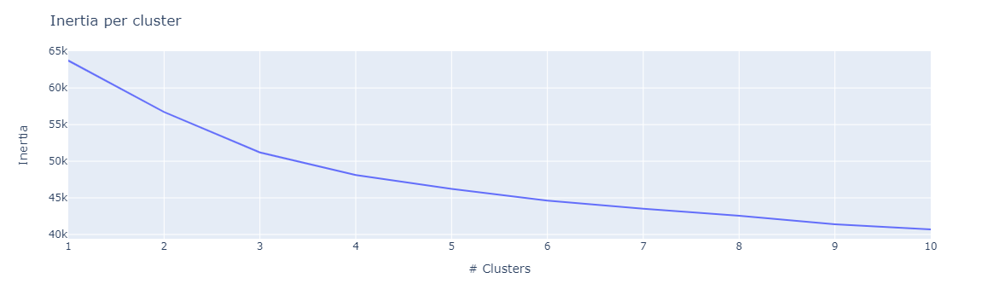

In [40]:
wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(us_preprocessed)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print(f"WCSS for K={i} --> {(wcss[-1])}")

wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)
fig.show()

#### Silouhette on sample

Silhouette score for K=2 is 0.10916355356748768
Silhouette score for K=3 is 0.11991766001315098
Silhouette score for K=4 is 0.09612984048682943
Silhouette score for K=5 is 0.08691444427431275
Silhouette score for K=6 is 0.08746257046831729
Silhouette score for K=7 is 0.08588702131748031
Silhouette score for K=8 is 0.06944697408275169
Silhouette score for K=9 is 0.07086076870292678
Silhouette score for K=10 is 0.08961479937962274


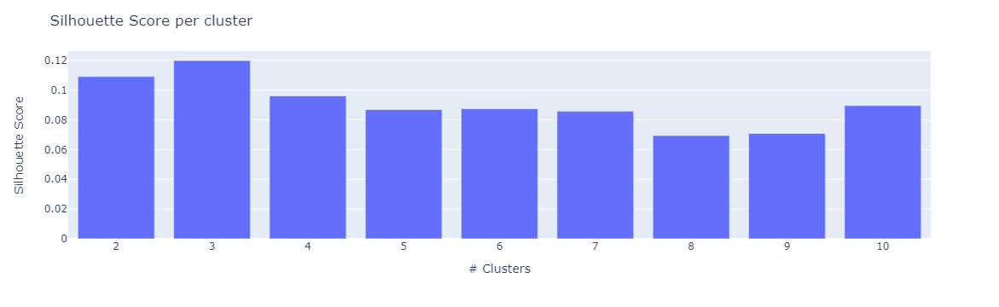

In [41]:
sil = []
k = []
for i in range (2,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(us_preprocessed)
    sil.append(silhouette_score(us_preprocessed, kmeans.predict(us_preprocessed)))
    k.append(i)
    print(f"Silhouette score for K={i} is {sil[-1]}")

cluster_scores=pd.DataFrame(sil)
k_frame = pd.Series(k)

fig = px.bar(data_frame=cluster_scores,  
             x=k, 
             y=cluster_scores.iloc[:, -1]
            )
fig.update_layout(
    yaxis_title="Silhouette Score",
    xaxis_title="# Clusters",
    title="Silhouette Score per cluster"
)

fig.show()

We will take K = 3

In [42]:
kmeans = KMeans(n_clusters=3 , random_state = 0)
kmeans.fit(us_preprocessed)

KMeans(n_clusters=3, random_state=0)

In [43]:
uber_sk = uber_s.copy()

In [44]:
uber_sk['Cluster_KMeans'] = kmeans.labels_
uber_sk

,Month,Week_day,Hour,Lat_r,Lon_r,Bin_15,Pickups,Cluster_KMeans
0,4,3,20,40.76,-73.97,20:15,8939,1
1,6,6,14,40.85,-73.94,14:45,9054,1
2,8,3,22,40.74,-73.98,22:45,10949,0
3,4,0,16,40.64,-73.78,16:30,10642,2
4,9,2,20,40.76,-73.98,20:30,15664,0
...,...,...,...,...,...,...,...,...
9995,9,0,9,40.72,-73.99,09:15,9694,1
9996,5,4,12,40.77,-73.99,12:45,6192,1
9997,5,4,5,40.76,-73.92,05:15,2500,1
9998,8,6,11,40.78,-74.01,11:45,7778,1


In [45]:
fig = px.scatter_mapbox(uber_sk.sort_values('Bin_15'), lat="Lat_r", lon="Lon_r", color="Cluster_KMeans",
                        mapbox_style="open-street-map",
                        animation_frame = 'Bin_15',
                        size='Pickups',
                        color_continuous_scale=px.colors.cyclical.HSV,
                        zoom=10,
                        height=600)
fig.update_layout(
    
    margin=dict(l=30, r=30, t=30, b=30),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### DBSCAN on sample

#### Euclidian metric

In [46]:
db_euc = DBSCAN(eps=2, min_samples=12, metric="euclidean", algorithm="brute")
db_euc.fit(us_preprocessed)

DBSCAN(algorithm='brute', eps=2, min_samples=12)

In [47]:
uber_sk['Cluster_db_euc'] = db_euc.labels_
tk = (uber_sk['Cluster_db_euc'] != -1)
uber_skf = uber_sk.loc[tk,:]
uber_skf['Cluster_db_euc'].value_counts()

0    8697
1     708
2      52
Name: Cluster_db_euc, dtype: int64

In [48]:
fig = px.scatter_mapbox(uber_skf.sort_values('Bin_15'), lat="Lat_r", lon="Lon_r", color="Cluster_db_euc",
                        mapbox_style="open-street-map",
                        animation_frame = 'Bin_15',
                        size='Pickups',
                        color_continuous_scale=px.colors.cyclical.Twilight,
                        zoom=10,
                        height=600)
fig.update_layout(
    
    margin=dict(l=30, r=30, t=30, b=30),
    paper_bgcolor="LightSteelBlue",
)
fig.show()